<h1 align = 'center'>Intrusion Detection In Wireless Sensor Networks</h1>
<hr>


<img src="https://psiborg.in/wp-content/uploads/2021/07/Embedded-banner-2048_11zon-1.jpg" alt="wsn-google-image" width="1000" height="1000">
<br>
<code>img credit: psiborg</code>


In [279]:
#primary utils
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas_profiling import profile_report
from pandas.plotting import scatter_matrix

#sklearn
import sklearn
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split,GridSearchCV,RepeatedStratifiedKFold,cross_val_score
#models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier,RandomForestClassifier

# -- xgboost
import xgboost
from xgboost import XGBClassifier

# -- stacking
import mlxtend
from mlxtend.classifier import StackingClassifier

#metrics
from sklearn.metrics import precision_recall_curve,precision_recall_fscore_support
from sklearn.metrics import plot_confusion_matrix

#imblean tools for handling imablaced dataset
import imblearn
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE,BorderlineSMOTE,ADASYN 
from imblearn.under_sampling import RandomUnderSampler

#count frequencies
from collections import Counter

#wandb - logging
import wandb

In [283]:
print("sklean version :", sklearn.__version__)
print("imblearn version :", imblearn.__version__)
print("wandb version :", wandb.__version__)
print("pandas :",pd.__version__)
print("numpy :",np.__version__)
print("seaborn :", sns.__version__)
print("mlxtend :", mlxtend.__version__)
print("xgboost :",xgboost.__version__)

sklean version : 1.1.2
imblearn version : 0.9.1
wandb version : 0.13.4
pandas : 1.4.4
numpy : 1.23.3
seaborn : 0.12.0
mlxtend : 0.21.0
xgboost : 1.5.0


In [100]:
wandb.login(force = True)

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


True

In [101]:
wandb.init(project = 'wsn-intrusion-detection')

In [18]:
df = pd.read_csv("./WSN-DS.csv")
df.head()

,id,Time,Is_CH,who CH,Dist_To_CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,dist_CH_To_BS,send_code,Expaned Energy,Attack type
0,101000,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940,Normal
1,101001,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957,Normal
2,101002,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898,Normal
3,101003,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673,Normal
4,101004,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534,Normal


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374661 entries, 0 to 374660
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0    id               374661 non-null  int64  
 1    Time             374661 non-null  int64  
 2    Is_CH            374661 non-null  int64  
 3    who CH           374661 non-null  int64  
 4    Dist_To_CH       374661 non-null  float64
 5    ADV_S            374661 non-null  int64  
 6    ADV_R            374661 non-null  int64  
 7    JOIN_S           374661 non-null  int64  
 8    JOIN_R           374661 non-null  int64  
 9    SCH_S            374661 non-null  int64  
 10   SCH_R            374661 non-null  int64  
 11  Rank              374661 non-null  int64  
 12   DATA_S           374661 non-null  int64  
 13   DATA_R           374661 non-null  int64  
 14   Data_Sent_To_BS  374661 non-null  int64  
 15   dist_CH_To_BS    374661 non-null  float64
 16   send_code        37

In [20]:
df.describe(include = int)

,id,Time,Is_CH,who CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,send_code
count,3.746610e+05,374661.000000,374661.000000,3.746610e+05,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000
mean,2.749693e+05,1064.748712,0.115766,2.749804e+05,0.267698,6.940562,0.779905,0.737493,0.288984,0.747452,9.687104,44.857925,73.890045,4.569448,2.497957
std,3.898986e+05,899.646164,0.319945,3.899112e+05,2.061148,7.044319,0.414311,4.691498,2.754746,0.434475,14.681901,42.574464,230.246335,19.679155,2.407337
min,1.010000e+05,50.000000,0.000000,1.010000e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.070930e+05,353.000000,0.000000,1.070960e+05,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,13.000000,0.000000,0.000000,1.000000
50%,1.160710e+05,803.000000,0.000000,1.160720e+05,0.000000,5.000000,1.000000,0.000000,0.000000,1.000000,3.000000,35.000000,0.000000,0.000000,2.000000
75%,2.150720e+05,1503.000000,0.000000,2.150730e+05,0.000000,7.000000,1.000000,0.000000,0.000000,1.000000,13.000000,62.000000,0.000000,0.000000,4.000000
max,3.402096e+06,3600.000000,1.000000,3.402100e+06,97.000000,117.000000,1.000000,124.000000,99.000000,1.000000,99.000000,241.000000,1496.000000,241.000000,15.000000


In [21]:
df.select_dtypes('int').astype(pd.CategoricalDtype()).describe()

,id,Time,Is_CH,who CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,send_code
count,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661
unique,11120,196,2,7088,85,31,2,101,95,2,100,192,1345,237,16
top,101000,53,0,202100,0,4,1,0,0,1,1,0,0,0,0
freq,139,13600,331288,3554,331288,53971,292200,355792,355804,280041,96148,60340,319114,308061,82461


In [22]:
df.select_dtypes(float).describe()

,Dist_To_CH,dist_CH_To_BS,Expaned Energy
count,374661.000000,374661.000000,374661.000000
mean,22.599380,22.562735,0.305661
std,21.955794,50.261604,0.669462
min,0.000000,0.000000,0.000000
25%,4.735440,0.000000,0.056150
50%,18.372610,0.000000,0.097970
75%,33.776000,0.000000,0.217760
max,214.274620,201.934940,45.093940


In [23]:
df.columns

Index([' id', ' Time', ' Is_CH', ' who CH', ' Dist_To_CH', ' ADV_S', ' ADV_R',
       ' JOIN_S', ' JOIN_R', ' SCH_S', ' SCH_R', 'Rank', ' DATA_S', ' DATA_R',
       ' Data_Sent_To_BS', ' dist_CH_To_BS', ' send_code ', 'Expaned Energy',
       'Attack type'],
      dtype='object')

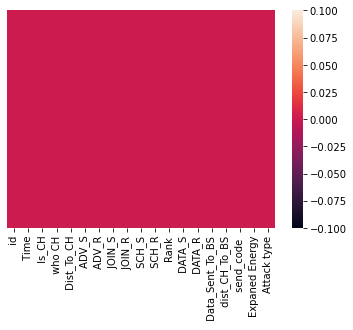

In [24]:
sns.heatmap(df.isna(),yticklabels = False);

In [25]:
lower = lambda x: [i.lower().lstrip() for i in x] #make columns lower case and strip off left whitespacespaces

# df.columns = [x.lower().lstrip() for x in df.columns] 
df.columns = lower(df.columns)

df.columns = [x.replace(' ',"_") for x in df.columns] #replace all spaces in column names with underscore

In [26]:
df.columns

Index(['id', 'time', 'is_ch', 'who_ch', 'dist_to_ch', 'adv_s', 'adv_r',
       'join_s', 'join_r', 'sch_s', 'sch_r', 'rank', 'data_s', 'data_r',
       'data_sent_to_bs', 'dist_ch_to_bs', 'send_code_', 'expaned_energy',
       'attack_type'],
      dtype='object')

In [27]:
df.head()

,id,time,is_ch,who_ch,dist_to_ch,adv_s,adv_r,join_s,join_r,sch_s,sch_r,rank,data_s,data_r,data_sent_to_bs,dist_ch_to_bs,send_code_,expaned_energy,attack_type
0,101000,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940,Normal
1,101001,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957,Normal
2,101002,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898,Normal
3,101003,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673,Normal
4,101004,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534,Normal


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374661 entries, 0 to 374660
Data columns (total 19 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               374661 non-null  int64  
 1   time             374661 non-null  int64  
 2   is_ch            374661 non-null  int64  
 3   who_ch           374661 non-null  int64  
 4   dist_to_ch       374661 non-null  float64
 5   adv_s            374661 non-null  int64  
 6   adv_r            374661 non-null  int64  
 7   join_s           374661 non-null  int64  
 8   join_r           374661 non-null  int64  
 9   sch_s            374661 non-null  int64  
 10  sch_r            374661 non-null  int64  
 11  rank             374661 non-null  int64  
 12  data_s           374661 non-null  int64  
 13  data_r           374661 non-null  int64  
 14  data_sent_to_bs  374661 non-null  int64  
 15  dist_ch_to_bs    374661 non-null  float64
 16  send_code_       374661 non-null  int6

In [29]:
not_duplicated = len(df) - len(df[df.duplicated()])
duplicated = len(df) - not_duplicated

print("total number of duplicated rows: ",duplicated)

print("percentage duplicated: ",round((len(df[df.duplicated()])/len(df))*100,3))

total number of duplicated rows:  8873
percentage duplicated:  2.368


In [30]:
len(df) - len(df[df.id.duplicated()])

11120

In [19]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

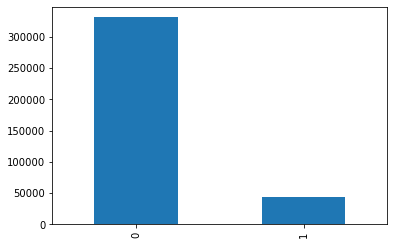

In [19]:
#is_ch; A flag to distinguish whether the node is CH with value 1 or normal node with value 0.
#how many channels are present


df['is_ch'].value_counts().plot(kind = 'bar')

In [31]:
df.attack_type.unique()


array(['Normal', 'Flooding', 'TDMA', 'Grayhole', 'Blackhole'],
      dtype=object)

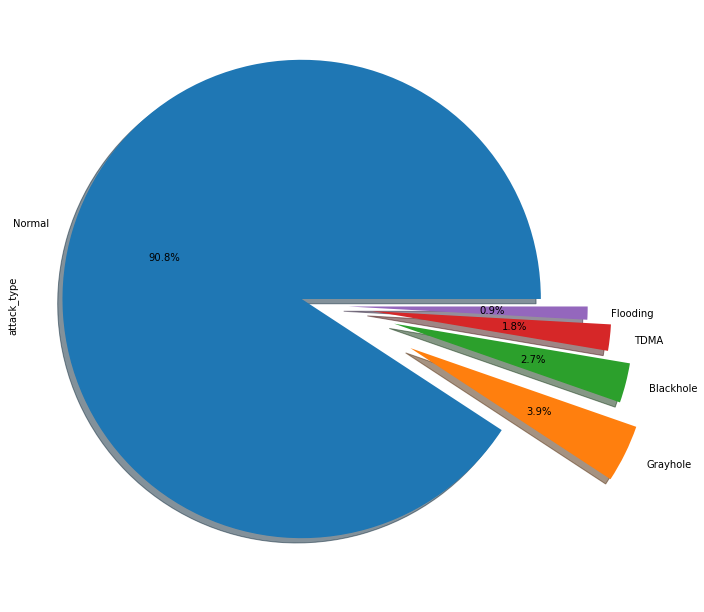

In [32]:
#category distribution
plt.figure(figsize = (11,11))
df['attack_type'].value_counts().plot(kind = 'pie',explode = [0.1,0.4,0.3,0.2,0.1],shadow = True,autopct = '%1.1f%%');

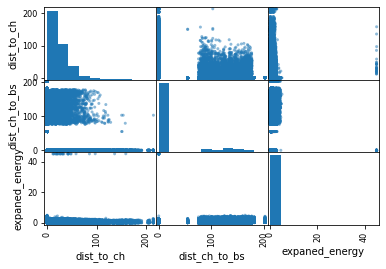

In [33]:
scatter_matrix(df.select_dtypes(float));

# Assessment Report 
<ul>
    <li>No missing data was found</li>
    <li>2.368% of the data has been found to be duplicated, thats a total of 8873</li>
    <li>Target or predictand is heavily imbalanced, with 'Normal' being the model class covering over 90% samples</li>
</ul>

# Data Splitting and Preprocessing

<hr>

In [34]:
drop_duplicates =  lambda x:x.drop_duplicates()
df = drop_duplicates(df)

In [22]:
#drop_duplicates =  lambda x:x.drop_duplicates() #works but note that lambda functions are not pickleable

def drop_duplicates(X,y):
    """drop duplicates in x
    
    Args:
        X:pandas.DataFrame
    Return:
        pandas.DataFrame | pandas dataframe containing no duplicated values
        """
    data = pd.concat([X,y],axis = 1)
    return data.drop_duplicates()

In [35]:
df.shape

(365788, 19)

In [36]:
#defining features and target variables

X = df.drop(columns = ['attack_type','id'],axis = 1)
y = df['attack_type']

In [141]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42,stratify = y) #applying data splitting with stratified sampling on the target variable due to class imbalance

In [38]:
print("samples available for training: ,", len(X_train))
print("samples available for testing : ", len(X_test))

samples available for training: , 256051
samples available for testing :  109737


In [39]:
y_train.value_counts()

Normal       232428
Grayhole       9736
Blackhole      7034
TDMA           4643
Flooding       2210
Name: attack_type, dtype: int64

In [40]:
over = SMOTE(sampling_strategy='not majority', k_neighbors=5)
undersample = RandomUnderSampler(sampling_strategy= {'Normal':10217})

borderline_oversample  = BorderlineSMOTE() #variant of smote | oversampling technique

#--Under Sampling
undersample_all = RandomUnderSampler(sampling_strategy = 'all')

## K Nearest Neigbors Algorithm

In [67]:
?knn_model

In [56]:
knn_model = KNeighborsClassifier(n_neighbors = 5) #knn model

#construct pipeline steps

knn_steps = [('sampling', undersample_all),  ('model',knn_model)]

In [57]:
knn_pipeline = Pipeline(steps= knn_steps)
knn_pipeline

Pipeline(steps=[('sampling', RandomUnderSampler(sampling_strategy='all')),
                ('model', KNeighborsClassifier())])

In [58]:
#Hyper Parameters
knn_pipeline.get_params()

{'memory': None,
 'steps': [('sampling', RandomUnderSampler(sampling_strategy='all')),
  ('model', KNeighborsClassifier())],
 'verbose': False,
 'sampling': RandomUnderSampler(sampling_strategy='all'),
 'model': KNeighborsClassifier(),
 'sampling__random_state': None,
 'sampling__replacement': False,
 'sampling__sampling_strategy': 'all',
 'model__algorithm': 'auto',
 'model__leaf_size': 30,
 'model__metric': 'minkowski',
 'model__metric_params': None,
 'model__n_jobs': None,
 'model__n_neighbors': 5,
 'model__p': 2,
 'model__weights': 'uniform'}

In [59]:
knn_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', RandomUnderSampler(sampling_strategy='all')),
                ('model', KNeighborsClassifier())])

In [60]:
knn_pipeline.score(X_test,y_test)

0.7724377374996583

In [62]:
?GridSearchCV

### Model Tuning 

In [68]:
params = {
    'model__n_neighbors':list(range(1,12,2)), [1,3,5,7,11]
    'model__metric':['euclidean','cosine','manhattan','l1','l2'],
    'sampling':[over,borderline_oversample]
}

gscv = GridSearchCV(estimator = knn_pipeline,param_grid = params,scoring = 'accuracy',cv = 5,verbose = 3)
gscv

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('sampling',
                                        RandomUnderSampler(sampling_strategy='all')),
                                       ('model', KNeighborsClassifier())]),
             param_grid={'model__metric': ['euclidean', 'cosine', 'manhattan',
                                           'l1', 'l2'],
                         'model__n_neighbors': [1, 3, 5, 7, 9, 11],
                         'sampling': [SMOTE(sampling_strategy='not majority'),
                                      BorderlineSMOTE()]},
             scoring='accuracy', verbose=3)

In [69]:
#35 hours+ tuning time... Do not run, unless under extremely necessary situations

# gscv.fit(X_train,y_train) 

Fitting 10 folds for each of 60 candidates, totalling 600 fits
[CV 1/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 1.6min
[CV 2/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time=  32.0s
[CV 3/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time=  27.5s
[CV 4/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time=  27.9s
[CV 5/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.973 total time=  29.9s
[CV 6/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time=  31.2s
[CV 7/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sam

[CV 3/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  28.2s
[CV 4/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  28.7s
[CV 5/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  28.3s
[CV 6/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.959 total time=  30.5s
[CV 7/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  30.7s
[CV 8/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  32.8s
[CV 9/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  32.1s

[CV 5/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.977 total time= 7.1min
[CV 6/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 7.0min
[CV 7/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time= 7.3min
[CV 8/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 7.0min
[CV 9/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.978 total time= 7.0min
[CV 10/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.977 total time= 7.2min
[CV 1/10] END model__metric=cosine, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 7.1min
[CV 2/10] END model__metric=cosine, model

[CV 9/10] END model__metric=cosine, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.962 total time= 9.1min
[CV 10/10] END model__metric=cosine, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.961 total time= 8.9min
[CV 1/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.969 total time= 8.0min
[CV 2/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.965 total time= 9.0min
[CV 3/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.967 total time= 9.5min
[CV 4/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.967 total time= 9.0min
[CV 5/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.968 total time= 9.9min
[CV 6/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.969 total time=10.2min
[CV 7/10] E

[CV 2/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.4min
[CV 3/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.5min
[CV 4/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.4min
[CV 5/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.983 total time= 1.4min
[CV 6/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.5min
[CV 7/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.983 total time= 1.6min
[CV 8/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 9/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 10/10] END model__metric=man

[CV 5/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.3min
[CV 6/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.977 total time= 1.5min
[CV 7/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.973 total time= 1.3min
[CV 8/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.3min
[CV 9/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.976 total time= 1.4min
[CV 10/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.5min
[CV 1/10] END model__metric=manhattan, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.4min
[CV 2/10] END model__metric=manhattan, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.965 total 

[CV 9/10] END model__metric=l1, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 10/10] END model__metric=l1, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 1/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time= 1.4min
[CV 2/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time= 1.4min
[CV 3/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.973 total time= 2.3min
[CV 4/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time= 6.2min
[CV 5/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.972 total time= 2.3min
[CV 6/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not

[CV 5/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.963 total time= 1.2min
[CV 6/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.3min
[CV 7/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.963 total time= 1.3min
[CV 8/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.2min
[CV 9/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.965 total time= 1.2min
[CV 10/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.966 total time= 1.3min
[CV 1/10] END model__metric=l1, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.973 total time= 1.3min
[CV 2/10] END model__metric=l1, model__n_neighbors=9, sampling=Border

[CV 10/10] END model__metric=l2, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.968 total time= 1.2min
[CV 1/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.979 total time= 1.4min
[CV 2/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.978 total time= 1.3min
[CV 3/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.977 total time= 1.3min
[CV 4/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.977 total time= 1.3min
[CV 5/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.976 total time= 1.3min
[CV 6/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.978 total time= 1.3min
[CV 7/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.976 total time= 1.3min
[CV 8/10] END model__metric=l2, model__n_neighbors=3, sampling=Bo

[CV 6/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 7/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.965 total time= 1.3min
[CV 8/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.965 total time= 1.3min
[CV 9/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 10/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 1/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.954 total time= 1.8min
[CV 2/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.952 total time= 1.2min
[CV 3/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.952 total time= 1.2min
[CV 4/10] END mode

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('sampling',
                                        RandomUnderSampler(sampling_strategy='all')),
                                       ('model', KNeighborsClassifier())]),
             param_grid={'model__metric': ['euclidean', 'cosine', 'manhattan',
                                           'l1', 'l2'],
                         'model__n_neighbors': [1, 3, 5, 7, 9, 11],
                         'sampling': [SMOTE(sampling_strategy='not majority'),
                                      BorderlineSMOTE()]},
             scoring='accuracy', verbose=3)

In [70]:
gscv.score(X_test,y_test)

0.9855928264851418

In [71]:
?gscv

In [73]:
dir(gscv)

['__abstractmethods__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_check_feature_names',
 '_check_n_features',
 '_check_refit_for_multimetric',
 '_estimator_type',
 '_format_results',
 '_get_param_names',
 '_get_tags',
 '_more_tags',
 '_repr_html_',
 '_repr_html_inner',
 '_repr_mimebundle_',
 '_required_parameters',
 '_run_search',
 '_select_best_index',
 '_validate_data',
 'best_estimator_',
 'best_index_',
 'best_params_',
 'best_score_',
 'classes_',
 'cv',
 'cv_results_',
 'decision_function',
 'error_score',
 'estimator',
 'feature_names_in_',
 'fit',
 'get_params',
 'inverse_transform',
 'multimetric_',
 'n_f

In [80]:
gscv.best_estimator_

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=1))])

In [74]:
gscv.best_score_

0.9843273371765611

In [86]:
gscv.cv_results_['mean_test_score']

array([0.97489953, 0.98128888, 0.96709639, 0.97741074, 0.96199975,
       0.97323189, 0.95819973, 0.96971306, 0.955751  , 0.96680349,
       0.95291562, 0.96363224, 0.97564157, 0.98319475, 0.96798684,
       0.97755915, 0.96351508, 0.97225552, 0.95985565, 0.96759629,
       0.95736006, 0.96420244, 0.95480587, 0.96157405, 0.98009771,
       0.98432734, 0.97407157, 0.9813006 , 0.96996692, 0.97814888,
       0.96670976, 0.97524712, 0.96407356, 0.97298975, 0.962031  ,
       0.97071677, 0.98021488, 0.9843    , 0.97413406, 0.98126545,
       0.97021687, 0.97812545, 0.96661602, 0.97527446, 0.96401108,
       0.97297023, 0.96212473, 0.97056836, 0.97486047, 0.98133575,
       0.96706906, 0.97744199, 0.96215597, 0.97331   , 0.95850826,
       0.96969353, 0.95551276, 0.96672147, 0.95274378, 0.9636713 ])

In [104]:
gscv.cv_results_.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_model__metric', 'param_model__n_neighbors', 'param_sampling', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'split5_test_score', 'split6_test_score', 'split7_test_score', 'split8_test_score', 'split9_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

In [107]:
knn_cv_results = pd.DataFrame(gscv.cv_results_)
knn_cv_results.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__metric,param_model__n_neighbors,param_sampling,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,4.221028,1.450688,32.758773,18.282115,euclidean,1,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.976295,0.975825,...,0.973950,0.972974,0.975356,0.973677,0.976645,0.974458,0.975317,0.974900,0.001127,18
1,9.991702,1.498805,27.670301,5.790024,euclidean,1,BorderlineSMOTE(),"{'model__metric': 'euclidean', 'model__n_neigh...",0.982035,0.982035,...,0.980863,0.980355,0.982113,0.979418,0.982074,0.981332,0.981800,0.981289,0.000861,6
2,3.960191,0.130066,26.651238,1.797848,euclidean,3,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.968640,0.967155,...,0.966764,0.964577,0.967975,0.966452,0.968639,0.966178,0.968600,0.967096,0.001294,35
3,10.081422,0.754482,25.398352,1.109253,euclidean,3,BorderlineSMOTE(),"{'model__metric': 'euclidean', 'model__n_neigh...",0.978755,0.978051,...,0.977114,0.976177,0.978637,0.975591,0.977309,0.977700,0.977934,0.977411,0.000966,14
4,3.537000,0.148390,23.829871,1.134731,euclidean,5,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.963056,0.962156,...,0.961453,0.960516,0.963054,0.960672,0.962976,0.961414,0.963015,0.962000,0.000946,50


In [116]:
knn_cv_results.sort_values(by = ['rank_test_score']).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__metric,param_model__n_neighbors,param_sampling,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
25,7.693983,0.292100,80.520795,3.320110,manhattan,1,BorderlineSMOTE(),"{'model__metric': 'manhattan', 'model__n_neigh...",0.985316,0.983870,...,0.984339,0.983089,0.985237,0.983285,0.984612,0.984651,0.985198,0.984327,0.000775,1
37,9.505472,2.500369,85.157174,8.632161,l1,1,BorderlineSMOTE(),"{'model__metric': 'l1', 'model__n_neighbors': ...",0.985199,0.984027,...,0.984261,0.983089,0.985276,0.983128,0.984573,0.984612,0.985237,0.984300,0.000789,2
13,8.888789,1.458221,480.206828,163.818024,cosine,1,BorderlineSMOTE(),"{'model__metric': 'cosine', 'model__n_neighbor...",0.984418,0.982113,...,0.982621,0.983870,0.984378,0.982191,0.982777,0.984300,0.982503,0.983195,0.000889,3
49,7.910062,0.632873,77.991880,3.002024,l2,1,BorderlineSMOTE(),"{'model__metric': 'l2', 'model__n_neighbors': ...",0.982114,0.981996,...,0.980824,0.980316,0.982230,0.979418,0.982230,0.981566,0.981800,0.981336,0.000901,4
27,7.978928,1.334974,86.230191,19.750097,manhattan,3,BorderlineSMOTE(),"{'model__metric': 'manhattan', 'model__n_neigh...",0.982075,0.981136,...,0.981996,0.980355,0.982464,0.979887,0.981254,0.981449,0.981644,0.981301,0.000762,5


In [117]:
# n_neighbor of 1 is ambigious sometimes and not recommended, hence we will choose the next best with a different n_neighbors
# The 5th rank test score with a mean test score of 98.16 will be taken as the best model

In [98]:
list(gscv.cv_results_['rank_test_score']).index(1)

25

In [102]:
gscv.cv_results_['mean_test_score'][25]

0.9843273371765611

In [237]:
knn = Pipeline([('sampling_strategy',BorderlineSMOTE()),('knn_model',KNeighborsClassifier(metric = 'manhattan',n_neighbors = 3))])
knn               

Pipeline(steps=[('sampling_strategy', BorderlineSMOTE()),
                ('knn_model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=3))])

In [238]:
?knn

In [239]:
knn.fit(X_train,y_train)

Pipeline(steps=[('sampling_strategy', BorderlineSMOTE()),
                ('knn_model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=3))])

###  Model Scoring and Evaluation

In [240]:
knn.score(X_test,y_test)

0.984235034673811

In [ ]:
plot_confusion_matrix(estimator = dt,X = X_test,y_true = y_test,xticks_rotation = 'vertical')

## Decision Tree Classifier

In [142]:
# Undersampling
X_train_,y_train_ = undersample_all.fit_resample(X_train,y_train)

In [143]:
dt = DecisionTreeClassifier(max_depth = 10,random_state=111)
dt

DecisionTreeClassifier(max_depth=10, random_state=111)

In [144]:
dt.fit(X_train_,y_train_)

DecisionTreeClassifier(max_depth=10, random_state=111)

In [67]:
dt.score(X_test,y_test)

0.9685065201345034

In [145]:
dt_cv_scores = cross_val_score(estimator = dt,cv = 10,X = X_train_,y = y_train_,error_score = True)
dt_cv_scores.mean()

0.973393665158371

D:\Users\mk-armah\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


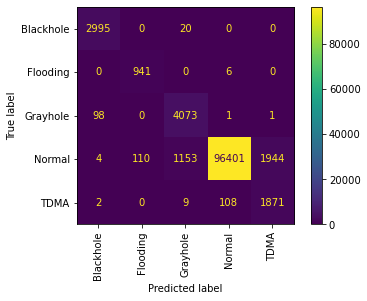

In [78]:
plot_confusion_matrix(estimator = dt,X = X_test,y_true = y_test,xticks_rotation = 'vertical')

In [105]:
y_pred = dt.predict(X_test)
y_probas = dt.predict_proba(X_test)

In [110]:
precision,recall,fscore,support = precision_recall_fscore_support(y_true = y_test,y_pred = y_pred)

In [113]:
print("Precision : ",precision,"\n")
print("recall : ",recall,"\n")
print("fscore : ",fscore,"\n")
print("support : ",support,"\n")

Precision :  [0.96644079 0.89533777 0.77507136 0.99880849 0.49030398] 

recall :  [0.9933665  0.9936642  0.97603642 0.96776493 0.94020101] 

fscore :  [0.97971868 0.94194194 0.86402206 0.98304169 0.64450568] 

support :  [ 3015   947  4173 99612  1990] 



In [125]:
wandb.sklearn.plot_precision_recall(y_true = y_test, y_probas = y_probas, labels = y_train.unique())

In [134]:
wandb.sklearn.plot_feature_importances(dt, X_train.columns)

D:\Users\mk-armah\miniconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [140]:
wandb.sklearn.plot_summary_metrics(dt, X_train, y_train, X_test, y_test)

D:\Users\mk-armah\miniconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [151]:
dt_steps = [('sampling',borderline_oversample),('model',dt)]
dt_pipeline = Pipeline(steps = dt_steps)
dt_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 DecisionTreeClassifier(max_depth=10, random_state=111))])

In [152]:
dt_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 DecisionTreeClassifier(max_depth=10, random_state=111))])

In [153]:
dt_pipeline.score(X_test,y_test)

0.9879439022389895

In [154]:
dt_pipeline.score(X_train,y_train)

0.9882640567699403

# Naive Bayes

In [90]:
nb = GaussianNB()

In [91]:
nb.fit(X_train,y_train)

GaussianNB()

In [92]:
nb.score(X_test,y_test)

0.8267494099528874

In [93]:
nb_cv_scores = cross_val_score(estimator = nb,cv = 10,X = X_train,y = y_train,error_score = True)
nb_cv_scores.mean()

0.724343891402715

D:\Users\mk-armah\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 720x792 with 0 Axes>

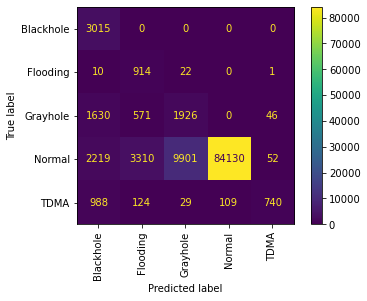

In [98]:
plt.figure(figsize = (10,11));
plot_confusion_matrix(estimator = nb,X = X_test,y_true = y_test,xticks_rotation = 'vertical');

In [121]:
nb_y_pred = dt.predict(X_test)
nb_y_probas = nb.predict_proba(X_test)

In [122]:
nb_y_probas

array([[6.52444950e-04, 1.07721006e-06, 1.90260981e-05, 9.81542940e-01,
        1.77845116e-02],
       [6.82144193e-04, 2.85272669e-06, 1.63111797e-05, 9.82726712e-01,
        1.65719796e-02],
       [9.65532745e-05, 1.83689500e-07, 2.94631509e-06, 9.96644397e-01,
        3.25592015e-03],
       ...,
       [9.12647008e-09, 3.46438434e-11, 2.10069695e-10, 9.99988427e-01,
        1.15633675e-05],
       [4.36824844e-41, 3.34180731e-44, 1.42778438e-42, 1.00000000e+00,
        1.92641261e-16],
       [2.08021713e-07, 2.90879762e-10, 4.10151611e-09, 9.99724923e-01,
        2.74864952e-04]])

In [123]:
precision,recall,fscore,support = precision_recall_fscore_support(y_true = y_test,y_pred = nb_y_pred)

In [124]:
print("Precision : ",precision,"\n")
print("recall : ",recall,"\n")
print("fscore : ",fscore,"\n")
print("support : ",support,"\n")

Precision :  [0.96644079 0.89533777 0.77507136 0.99880849 0.49030398] 

recall :  [0.9933665  0.9936642  0.97603642 0.96776493 0.94020101] 

fscore :  [0.97971868 0.94194194 0.86402206 0.98304169 0.64450568] 

support :  [ 3015   947  4173 99612  1990] 



In [127]:
wandb.sklearn.plot_precision_recall(y_true = y_test, y_probas =nb_y_probas, labels = y_train.unique())

wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=9 sec). Create a new API with an integer timeout larger than 9, e.g., `api = wandb.Api(timeout=19)` to increase the graphql timeout.


In [139]:
wandb.sklearn.plot_summary_metrics(nb, X_train, y_train, X_test, y_test)

D:\Users\mk-armah\miniconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


In [183]:
# ?wandb.sklearn.plot_summary_metrics
from sklearn.preprocessing import StandardScaler,MinMaxScaler

In [184]:
nb_steps = [('sampling',borderline_oversample),('scaler',MinMaxScaler()),('model',nb)]
nb_pipeline = Pipeline(steps = nb_steps)
nb_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE()), ('scaler', MinMaxScaler()),
                ('model', GaussianNB())])

In [185]:
nb_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE()), ('scaler', MinMaxScaler()),
                ('model', GaussianNB())])

In [186]:
nb_cv_scores = cross_val_score(estimator = nb_pipeline,cv = 10,X = X_train,y = y_train,error_score = True)
nb_cv_scores.mean()

0.9515018416387013

In [187]:
nb_pipeline.score(X_test,y_test)

0.9518576232264414

# Ensemble Models

## Bagging

### Random Forest Classifier

In [170]:
rf = RandomForestClassifier(n_estimators = 400,random_state = 42)
rf_steps = [('sampling',borderline_oversample),('model',rf)]

In [171]:
rf_pipeline = Pipeline(steps = steps)
rf_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 DecisionTreeClassifier(max_depth=10, random_state=111))])

In [172]:
rf_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 DecisionTreeClassifier(max_depth=10, random_state=111))])

In [174]:
rf_cv_scores = cross_val_score(estimator = rf_pipeline,cv = 10,X = X_train,y = y_train,error_score = 'raise')
rf_cv_scores.mean()

0.9861785391815342

In [175]:
rf_pipeline.score(X_test,y_test)

0.9860757994113198

## Boosting

In [193]:
adaboost = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth = 10),n_estimators = 50,random_state = 42)
adaboost

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                   random_state=42)

In [196]:
adaboost_pipeline = Pipeline([('sampling',borderline_oversample),('model',adaboost)])
adaboost_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                                    random_state=42))])

In [199]:
adaboost_cv_scores = cross_val_score(estimator = adaboost_pipeline,X = X_train,y = y_train,cv = 10,error_score= 'raise')
adaboost_cv_scores.mean()

0.9870806865939858

In [202]:
adaboost.fit(X_train,y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                   random_state=42)

In [204]:
adaboost.score(X_test,y_test)

0.9963002451315418

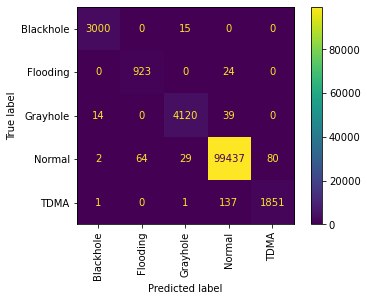

In [212]:
plot_confusion_matrix(estimator = adaboost,X = X_test,y_true = y_test,xticks_rotation='vertical');

## Stacking

In [232]:
xgb = XGBClassifier()
xgb.fit(X_train,y_train)

D:\Users\mk-armah\miniconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:20:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [233]:
xgb.score(X_train,y_train)

0.9988361693568859

In [234]:
xgb.score(X_test,y_test)

0.9972479655904571

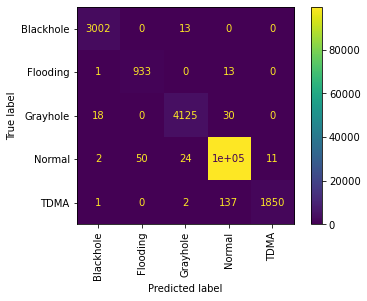

In [257]:
plot_confusion_matrix(estimator = xgb,X = X_test,y_true = y_test,xticks_rotation='vertical');

In [244]:
from sklearn.preprocessing import LabelEncoder

In [250]:
le = LabelEncoder()
y_train_le = le.fit_transform(y_train)

In [249]:
le.classes_

array(['Blackhole', 'Flooding', 'Grayhole', 'Normal', 'TDMA'],
      dtype=object)

In [242]:
stk_clf = StackingClassifier(classifiers = [dt,adaboost,rf],
                       meta_classifier = XGBClassifier(),
                        use_features_in_secondary = True)

In [251]:
stk_clf.fit(X_train,y_train_le)

D:\Users\mk-armah\miniconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:59:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


StackingClassifier(classifiers=[DecisionTreeClassifier(max_depth=10,
                                                       random_state=111),
                                AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                                                   random_state=42),
                                RandomForestClassifier(n_estimators=400)],
                   meta_classifier=XGBClassifier(base_score=None, booster=None,
                                                 colsample_bylevel=None,
                                                 colsample_bynode=None,
                                                 colsample_bytree=None,
                                                 enable_c...
                                                 learning_rate=None,
                                                 max_delta_step=None,
                                                 max_depth=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 n_estimators=100, n_jobs=None,
                                                 num_parallel_tree=None,
                                                 predictor=None,
                                                 random_state=None,
                                                 reg_alpha=None,
                                                 reg_lambda=None,
                                                 scale_pos_weight=None,
                                                 subsample=None,
                                                 tree_method=None,
                                                 validate_parameters=None,
                                                 verbosity=None),
                   use_features_in_secondary=True)

In [254]:
y_test_le = le.transform(y_test)

In [255]:
stk_clf.score(X_test,y_test_le)

0.9969290212052453

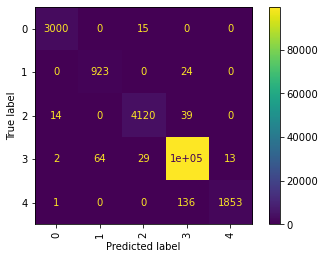

In [256]:
plot_confusion_matrix(estimator = stk_clf,X = X_test,y_true = y_test_le,xticks_rotation='vertical');

## Neural Network

In [ ]:
cross_val_score(estimator = stk_clf,X = X_train,y = y_train,cv = 10,error_score = 'raise')